In [29]:
import torch
model = torch.load('450.pkl')
device = torch.device('cpu')
model.to(device)
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [30]:
from PIL import Image
from torchvision.transforms import transforms
img = Image.open('./source/IMG_0503_source.png')
all_transforms = transforms.Compose([
                    transforms.ToTensor(),
                    ])
img = all_transforms(img)
img

tensor([[[0.8824, 0.8431, 0.7686,  ..., 0.9098, 0.8667, 0.8078],
         [0.8824, 0.8549, 0.7922,  ..., 0.8902, 0.8627, 0.8157],
         [0.8824, 0.8784, 0.8431,  ..., 0.8784, 0.8627, 0.8353],
         ...,
         [0.6157, 0.6157, 0.6118,  ..., 0.7216, 0.7255, 0.7294],
         [0.6000, 0.6078, 0.6157,  ..., 0.7059, 0.7098, 0.7137],
         [0.5843, 0.6000, 0.6118,  ..., 0.7176, 0.7294, 0.7373]],

        [[0.8706, 0.8314, 0.7569,  ..., 0.9098, 0.8667, 0.8078],
         [0.8706, 0.8431, 0.7804,  ..., 0.8902, 0.8627, 0.8157],
         [0.8706, 0.8667, 0.8314,  ..., 0.8784, 0.8627, 0.8353],
         ...,
         [0.5569, 0.5569, 0.5529,  ..., 0.6941, 0.6980, 0.7020],
         [0.5412, 0.5490, 0.5569,  ..., 0.6784, 0.6824, 0.6863],
         [0.5255, 0.5412, 0.5529,  ..., 0.6902, 0.7020, 0.7098]],

        [[0.8510, 0.8118, 0.7373,  ..., 0.9020, 0.8588, 0.8000],
         [0.8510, 0.8235, 0.7608,  ..., 0.8824, 0.8549, 0.8078],
         [0.8510, 0.8471, 0.8118,  ..., 0.8706, 0.8549, 0.

In [31]:
with torch.no_grad():
    prediction = model([img])

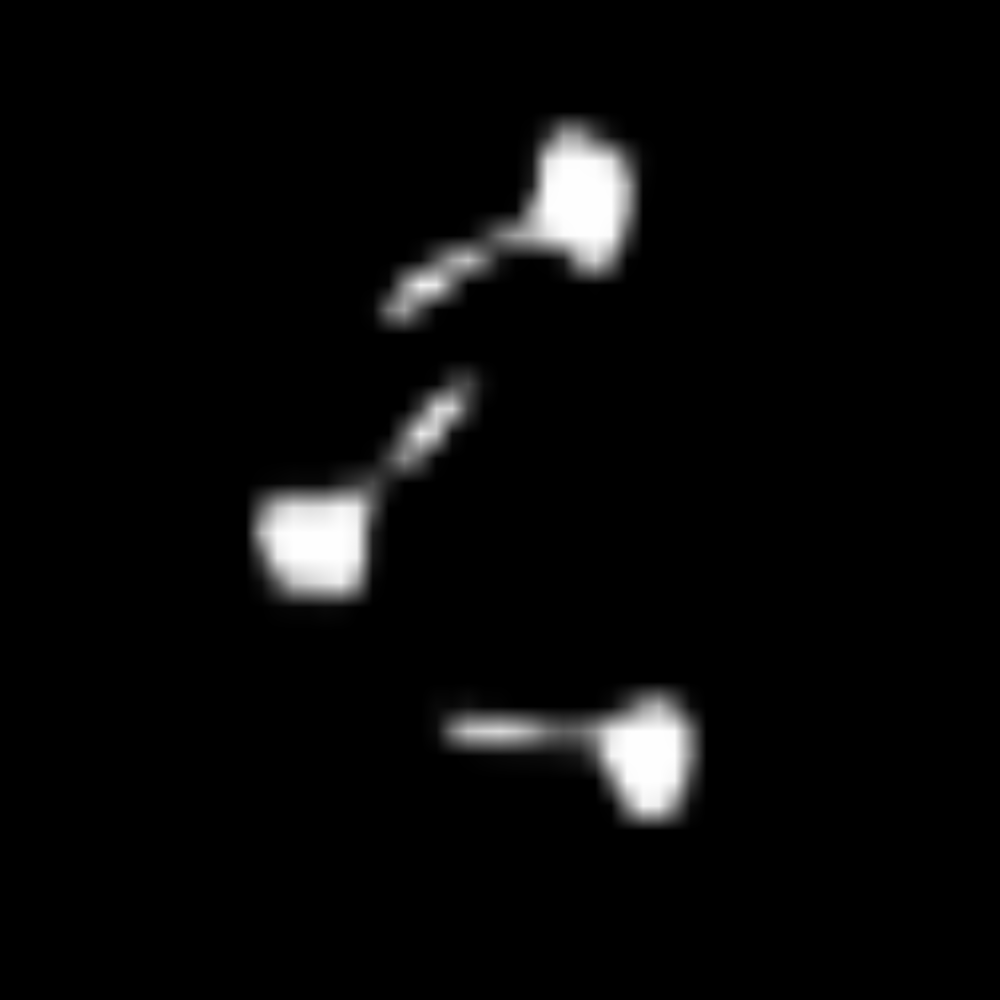

In [32]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

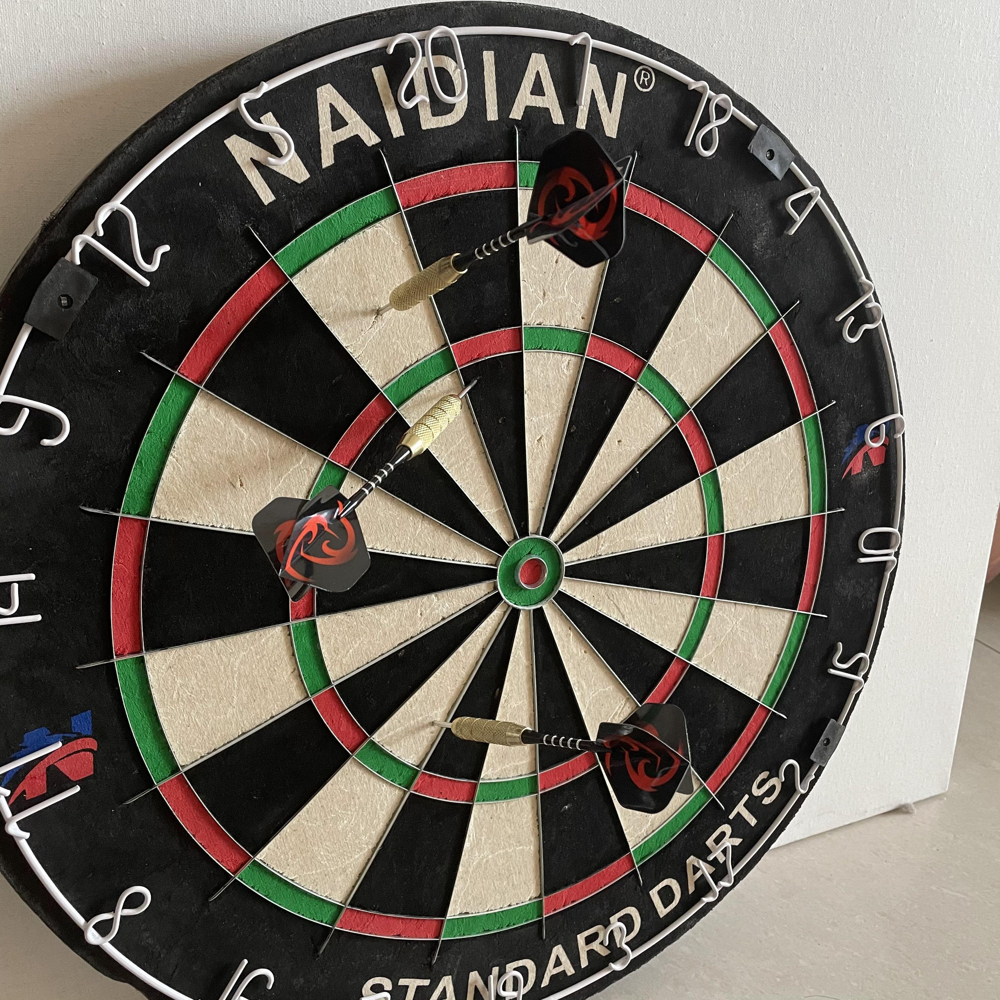

In [33]:
Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

In [28]:
prediction

[{'boxes': tensor([[ 763.3600,  380.2357, 2103.3215, 2455.8096]]),
  'labels': tensor([1]),
  'scores': tensor([1.]),
  'masks': tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            ...,
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.],
            [0., 0., 0.,  ..., 0., 0., 0.]]]])}]